In [1]:
# Load modules
import pandas as pd
import six
import seaborn as sns
import geopandas as gpd
import json
import numpy as np
from os import path
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib
if not path.exists('Sarabun-Regular.ttf'):
    !wget https://github.com/google/fonts/raw/main/ofl/sarabun/Sarabun-Regular.ttf -O Sarabun-Regular.ttf
if 'Sarabun' not in [x.name for x in matplotlib.font_manager.fontManager.ttflist]:
    matplotlib.font_manager.fontManager.addfont('Sarabun-Regular.ttf')
matplotlib.rc('font', family='Sarabun')

In [2]:
# Load the JSON files from https://github.com/PanJ/senate67
with open('province-districts.json', 'r', encoding='utf-8') as file:
    province_districts = json.load(file)

with open('district-candidates-round1-1717151315752.json', 'r', encoding='utf-8') as file:
    candidates = json.load(file)

# Create professional and social groups
groups = pd.read_csv('group.csv')

In [3]:
# Create DataFrame for province and districts
province_list = []
for province in province_districts:
    province_id = province['id']
    province_name = province['name']
    for district in province['districts']:
        district_id = district['id']
        district_name = district['name']
        province_list.append({
            'province_id': province_id,
            'province_name': province_name,
            'district_id': district_id,
            'district_name': district_name
        })
df_provinces = pd.DataFrame(province_list)

In [4]:
# Merge candidates and province/district names
df_candidates = pd.DataFrame(candidates).rename(columns={'province': 'province_id', 'district': 'district_id'})
merged_df = df_candidates.merge(df_provinces, on=['province_id', 'district_id']).merge(groups, on = 'job_group')
merged_df['id'] = merged_df.index

In [5]:
# Count the number of candidates for each title
title_counts = merged_df['title'].value_counts().reset_index()
title_counts.columns = ['title', 'total_candidates']

# Display the gender counts
title_counts

,title,total_candidates
0,นาย,24680
1,นาง,12572
2,น.ส.,6854
3,ร.ต.อ.,269
4,พ.ต.อ.,153
...,...,...
57,ว่าที่ พ.ต.ต.,1
58,นายกองตรี,1
59,ว่าที่ พ.ต.อ.,1
60,นายหมวดเอก,1


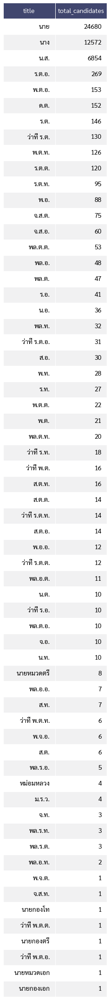

In [9]:
def render_mpl_table(data, col_width=3.0, row_height=0.625, font_size=14,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in  six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(title_counts, header_columns=0, col_width=2.0).figure.savefig("figures/title.jpg", dpi=300)

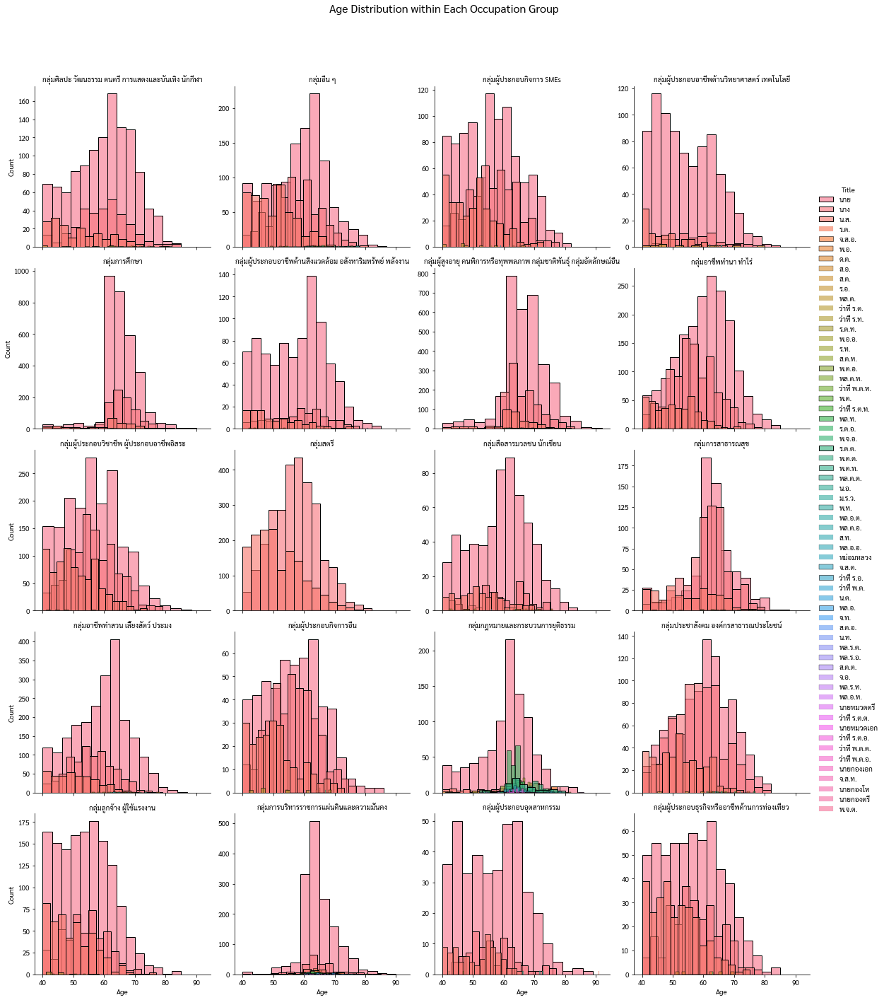

In [10]:
# Create the facet grid for age distribution
g = sns.FacetGrid(merged_df, col='job_name', hue='title', col_wrap=4, height=4, sharey=False)
g.map(sns.histplot, 'age', kde=False, bins=15, alpha=0.6)

# Add titles and labels
g.set_axis_labels('Age', 'Count')
g.set_titles(col_template="{col_name}")
g.add_legend(title="Title")

# Adjust layout
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Age Distribution within Each Occupation Group', fontsize=16)

# Show plot
plt.show()

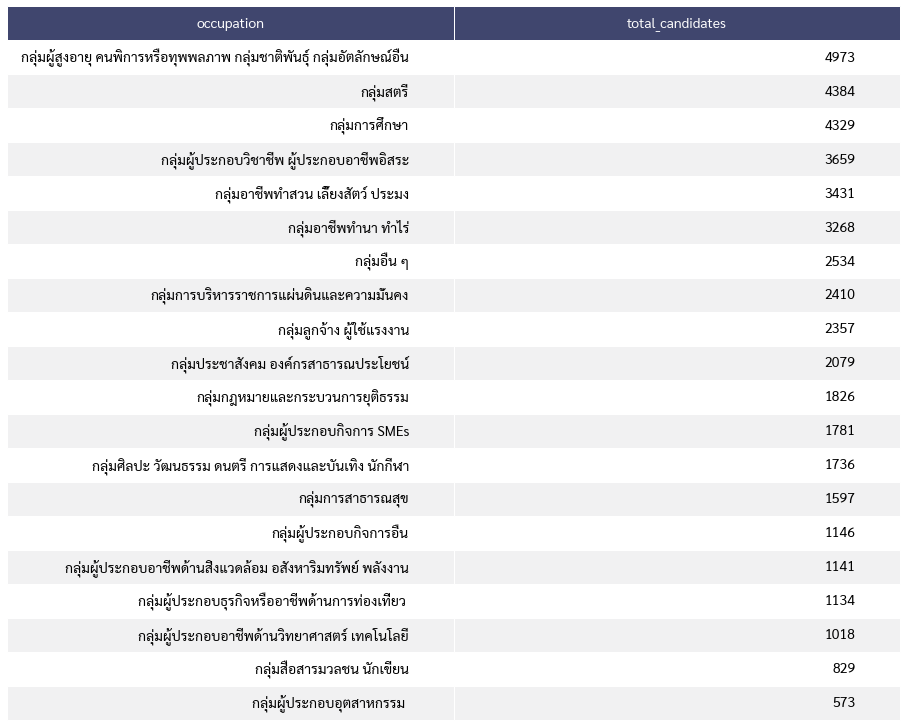

In [11]:
# Count the number of candidates for each occupation
top_occupations = merged_df['job_name'].value_counts().reset_index()
top_occupations.columns = ['occupation', 'total_candidates']

# Table
render_mpl_table(top_occupations, header_columns=0, col_width=8.0).figure.savefig("figures/top_occupations.jpg", dpi=300)

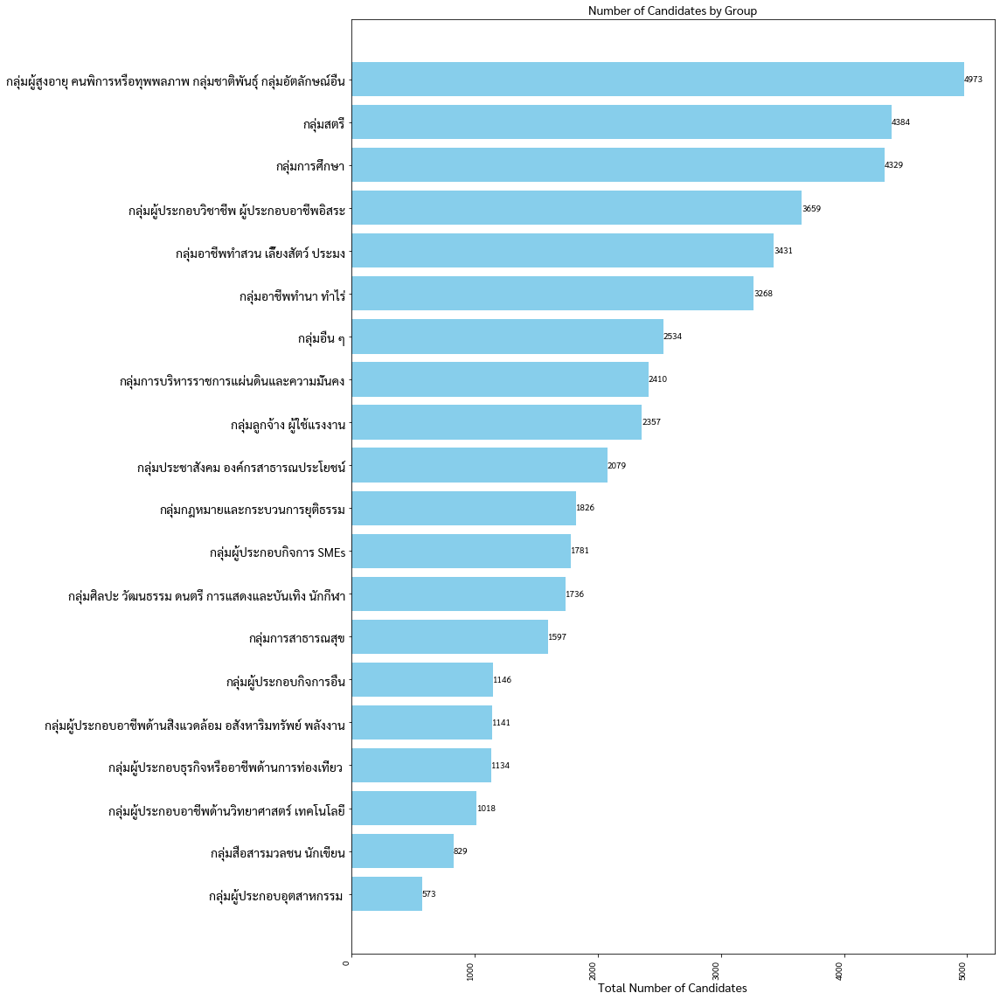

In [12]:
# Plot the top occupations using a bar chart
top_occupations = top_occupations.sort_values('total_candidates', ascending = True)
plt.figure(figsize=(16, 16))
bars = plt.barh(top_occupations['occupation'].astype(str), top_occupations['total_candidates'], color='skyblue')
plt.xlabel('Total Number of Candidates', fontsize=14)
plt.title('Number of Candidates by Group', fontsize=14)
plt.yticks(fontsize=14)  # Increase y-tick label font size

plt.xticks(rotation=90, ha='right')
plt.tight_layout()

# Add the exact amount of candidates for each occupation
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width()}', va='center', ha='left')

plt.savefig("figures/candidates_by_group.jpg", dpi=300)

In [13]:
# Group by province and district to count the number of candidates in each district
district_candidate_counts = (
    merged_df
    .groupby(['province_id', 'district_id'])
    .agg(total_candidates=('id', 'size'),
         province_name=('province_name', 'first'),
         district_name=('district_name', 'first'))
    .reset_index()
)

# Sort by total_candidates in descending order
district_candidate_counts = district_candidate_counts.sort_values(by='total_candidates', ascending=True)

# Display the result
district_candidate_counts.tail(20)

,province_id,district_id,total_candidates,province_name,district_name
272,33,4,197,ศรีสะเกษ,กันทรลักษ์
362,40,1,198,ขอนแก่น,เมืองขอนแก่น
187,26,4,198,นครนายก,องครักษ์
754,74,2,201,สมุทรสาคร,กระทุ่มแบน
97,16,6,205,ลพบุรี,บ้านหมี่
341,37,1,207,อำนาจเจริญ,เมืองอำนาจเจริญ
713,70,1,213,ราชบุรี,เมืองราชบุรี
69,14,1,219,พระนครศรีอยุธยา,พระนครศรีอยุธยา
184,26,1,222,นครนายก,เมืองนครนายก
513,49,3,233,มุกดาหาร,ดอนตาล


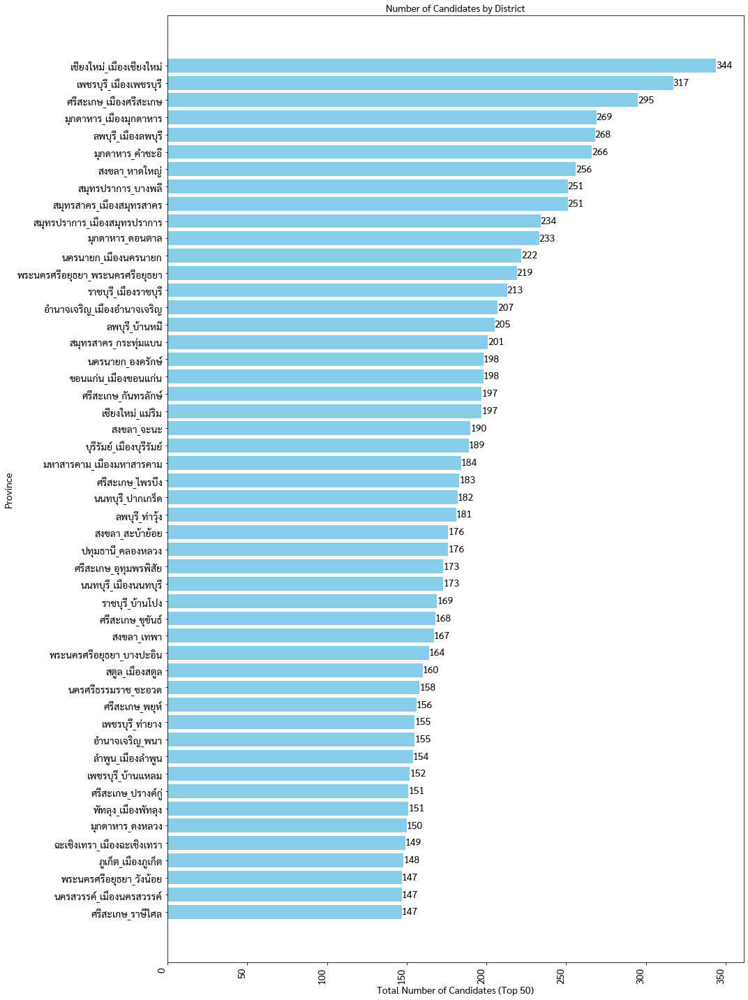

In [14]:
# Plot the number of candidates using a bar chart
district_candidate_counts['province_district'] = district_candidate_counts['province_name'] + '_' + district_candidate_counts['district_name']

plt.figure(figsize=(15, 20))
bars = plt.barh(district_candidate_counts.tail(50)['province_district'].astype(str), district_candidate_counts.tail(50)['total_candidates'], color='skyblue')
plt.ylabel('Province', fontsize=14)
plt.xlabel('Total Number of Candidates (Top 50)', fontsize=14)
plt.title('Number of Candidates by District', fontsize=14)
plt.xticks(rotation=90, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

# Add the exact amount of candidates for each province
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width()}', va='center', ha='left', fontsize=14)

plt.savefig("figures/candidates_by_district.jpg", dpi=300)

In [15]:
# Group by province to count the number of candidates in each province
province_candidate_counts = (
    merged_df
    .groupby('province_id')
    .agg(total_candidates=('id', 'size'),
         province_name=('province_name', 'first'))
    .reset_index()
)

# Sort by total_candidates in descending order
province_candidate_counts = province_candidate_counts.sort_values(by='total_candidates', ascending=True)
    
# Display the result
province_candidate_counts.tail(20)

,province_id,total_candidates,province_name
33,45,700,ร้อยเอ็ด
23,35,723,ยโสธร
71,91,737,สตูล
45,57,802,เชียงราย
25,37,802,อำนาจเจริญ
1,11,815,สมุทรปราการ
30,42,859,เลย
73,93,911,พัทลุง
55,70,1007,ราชบุรี
61,76,1073,เพชรบุรี


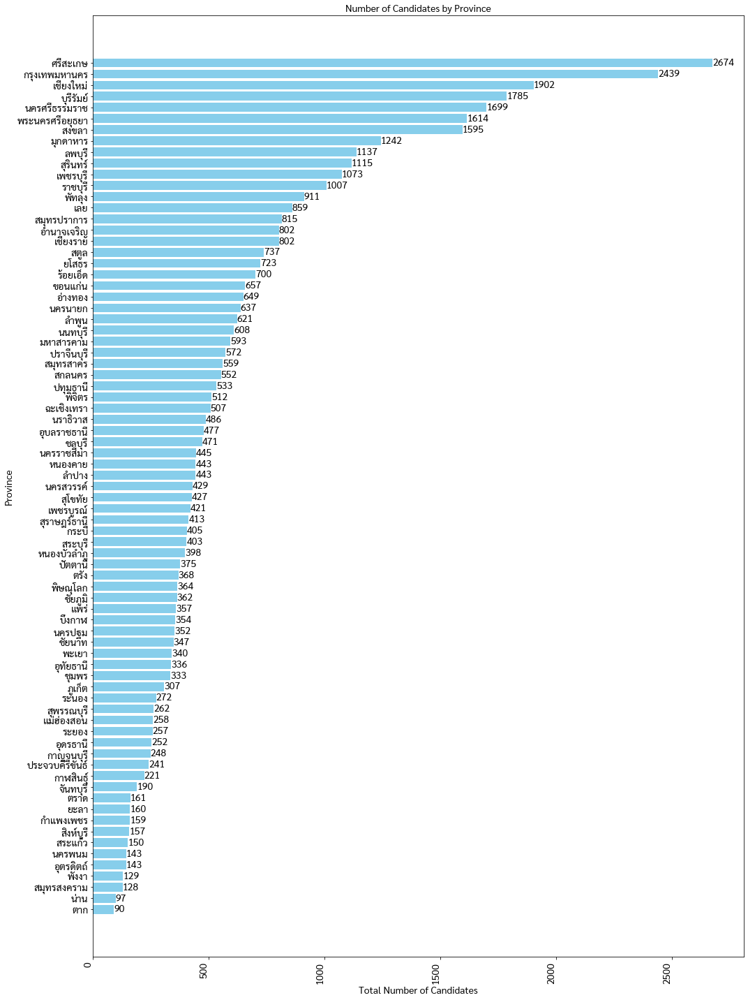

In [16]:
# Plot the number of candidates using a bar chart
plt.figure(figsize=(15, 20))
bars = plt.barh(province_candidate_counts['province_name'].astype(str), province_candidate_counts['total_candidates'], color='skyblue')
plt.ylabel('Province', fontsize=14)
plt.xlabel('Total Number of Candidates', fontsize=14)
plt.title('Number of Candidates by Province', fontsize=14)
plt.xticks(rotation=90, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

# Add the exact amount of candidates for each province
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width()}', va='center', ha='left', fontsize=14)
    
#for bar in bars:
    #plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{int(bar.get_height())}', ha='center', va='bottom')

plt.savefig("figures/candidates_by_province.jpg", dpi=300)

In [17]:
#### Mapping candidate distribution ####

# Import shapefile
map_df = gpd.read_file('tha_adm_rtsd_itos_20210121_shp/tha_admbnda_adm2_rtsd_20220121.shp')

# Prepare data
map_df['province_id'] = map_df['ADM1_PCODE'].str[2:].astype(int)
map_df['district_id'] = map_df['ADM2_PCODE'].str[4:].astype(int)
map_df['รหัสสำนักทะเบียน'] = map_df['ADM2_PCODE'].str[2:].astype(int)

# Merge
gdf = map_df.merge(district_candidate_counts, on = ['province_id', 'district_id'], how = 'left')

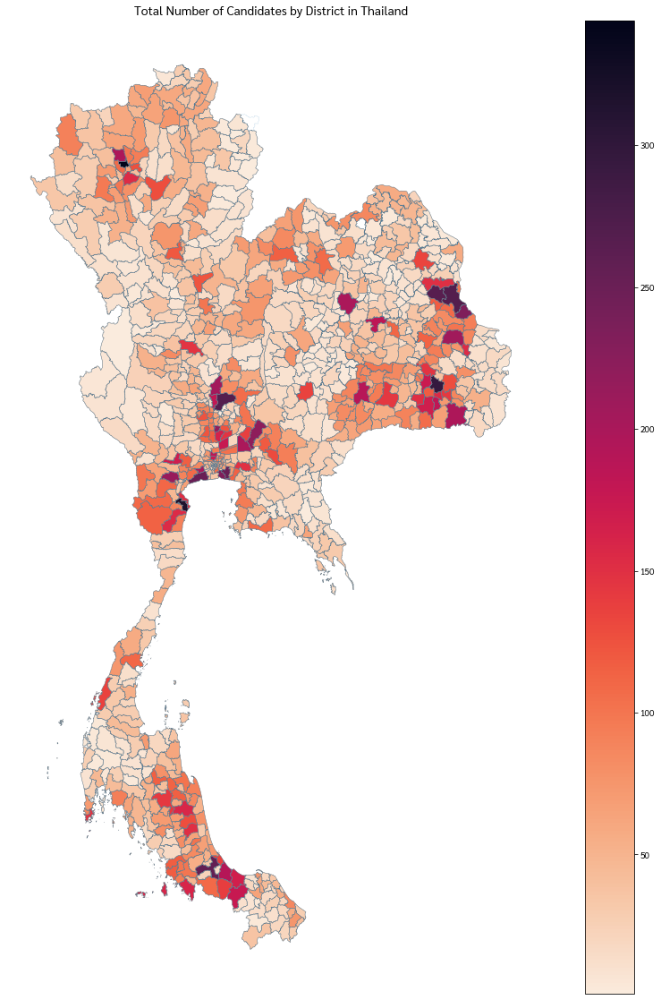

In [18]:
# Plot the data
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
gdf.boundary.plot(ax=ax, linewidth=0.1)
gdf.plot(column='total_candidates', ax=ax, legend=True, cmap='rocket_r', linewidth=0.5, edgecolor='0.5')

# Add title and labels
plt.title('Total Number of Candidates by District in Thailand', fontsize=14)
ax.set_axis_off()

# Show plot
plt.savefig("figures/map.jpg", dpi=300)

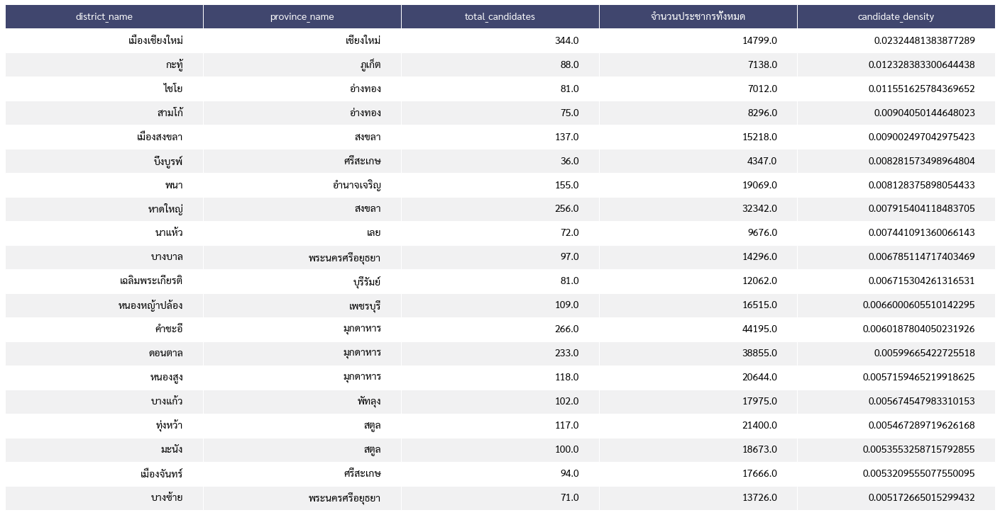

In [17]:
# Import population data
pop = pd.read_excel('stat_a66.xlsx')

# Merge
gdf = gdf.merge(pop, on = 'รหัสสำนักทะเบียน',  how = 'left')

# Calculate candidate density
gdf['candidate_density'] = gdf['total_candidates']/gdf['จำนวนประชากรทั้งหมด']

# Log transform
gdf['log_candidate_density'] = gdf['candidate_density'].apply(lambda x: 0 if x == 0 else (np.log(x + 1)))

# Show table
gdf.dropna(subset=['candidate_density'], inplace=True)
table_density = gdf.sort_values(by ='candidate_density', ascending = False)[['district_name', 'province_name', 'total_candidates', 'จำนวนประชากรทั้งหมด', 'candidate_density']].head(20)

# Save
render_mpl_table(table_density, header_columns=0, col_width=5.0).figure.savefig("figures/table_density.jpg", dpi=300)

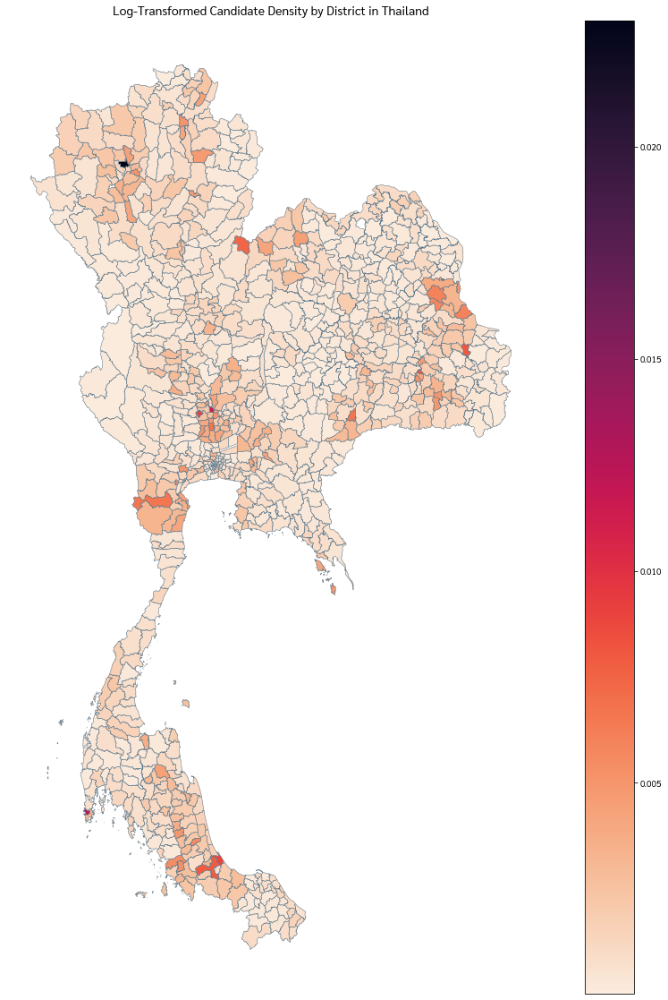

In [18]:
# Plot the data
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
gdf.boundary.plot(ax=ax, linewidth=0.1)
gdf.plot(column='log_candidate_density', ax=ax, legend=True, cmap='rocket_r', linewidth=0.5, edgecolor='0.5')

# Add title and labels
plt.title('Log-Transformed Candidate Density by District in Thailand', fontsize=14)
ax.set_axis_off()

# Show plot
plt.savefig("figures/map_density.jpg", dpi=300)

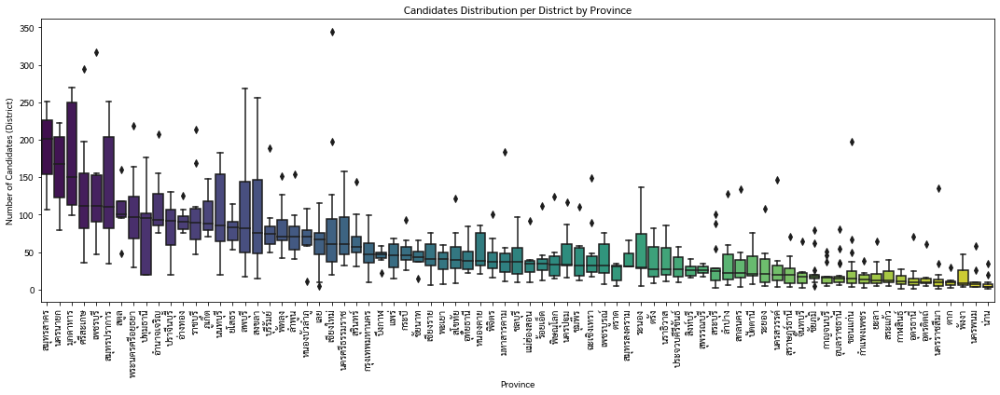

In [20]:
# Calculate the median candidates per district for each province
per_province = district_candidate_counts.groupby('province_name')['total_candidates'].median().sort_values(ascending=False)

# Create a box plot
plt.figure(figsize=(15, 6))
sns.boxplot(x=district_candidate_counts['province_name'], y=district_candidate_counts['total_candidates'], order=per_province.index, palette="viridis")
plt.title('Candidates Distribution per District by Province')
plt.xlabel('Province')
plt.ylabel('Number of Candidates (District)')
plt.xticks(rotation=90)
plt.tight_layout()

plt.savefig("figures/distribution.jpg", dpi=300)

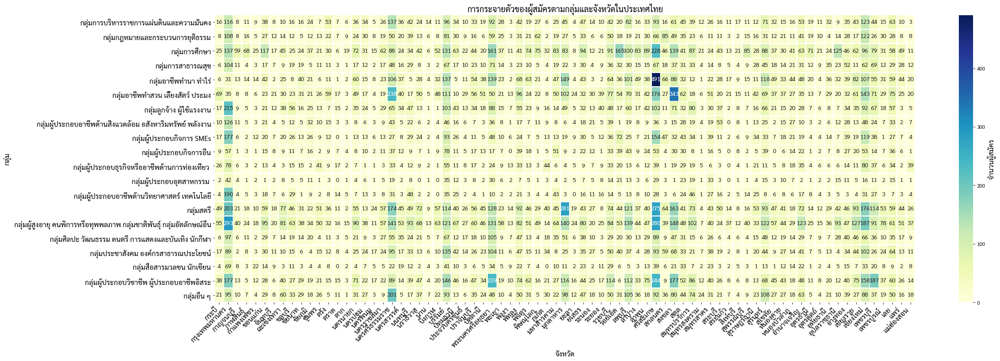

In [21]:
# Pivot
heatmap_data = merged_df.pivot_table(index='job_name', columns='province_name', values='id', aggfunc='count', fill_value=0)

# Get job_name-job_group mapping
job_group_mapping = groups.set_index('job_name')
heatmap_data = heatmap_data.join(job_group_mapping).sort_values('job_group').drop(columns='job_group')

# Create the heatmap with a better colormap scale
plt.figure(figsize=(30, 10))
heatmap = sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='d', linewidths=.5, annot_kws={"size": 12})

# Add a color bar for interpretation
cbar = heatmap.collections[0].colorbar
cbar.set_label('จำนวนผู้สมัคร', fontsize=14)

# Add titles and labels
plt.title(f'การกระจายตัวของผู้สมัครตามกลุ่มและจังหวัดในประเทศไทย', fontsize=16)
plt.xlabel('จังหวัด', fontsize=14)
plt.ylabel('กลุ่ม', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(rotation=0, fontsize=14)

# Adjust layout and save the plot
plt.tight_layout()
plt.savefig(f"figures/heatmap_province.jpg", dpi=300)

# Store province
with open(f'heatmaps/province.txt', 'x') as f:
    f.write(str(heatmap_data.columns.to_list()
))

# Drop index
heatmap_data = heatmap_data.reset_index(drop=True)

# Create data array
data_array = []
for job_index, row in heatmap_data.iterrows():
    for province_index, count in enumerate(row[1:]):  # Skip the first column which is job_name
        data_array.append([province_index, job_index, count])
with open(f'heatmaps/province_data.txt', 'x') as f:
    f.write(str(data_array))

<ipython-input-111-c2699496bfc9>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(30, 10))


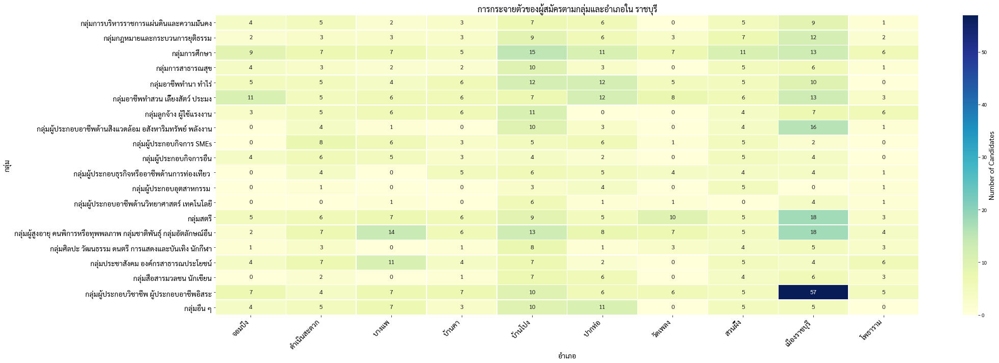

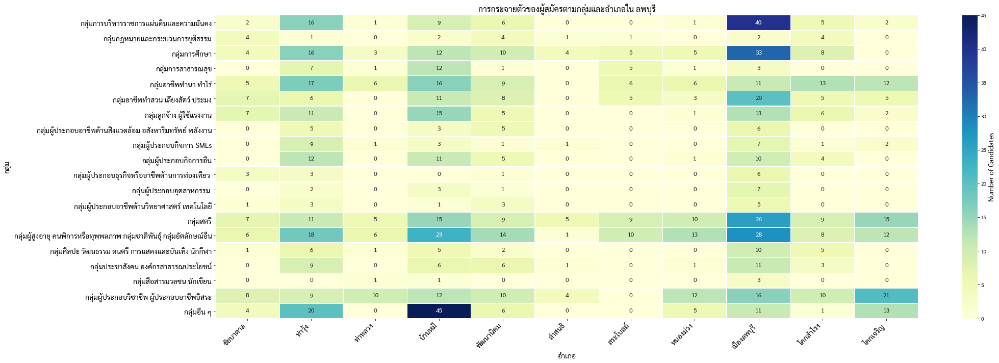

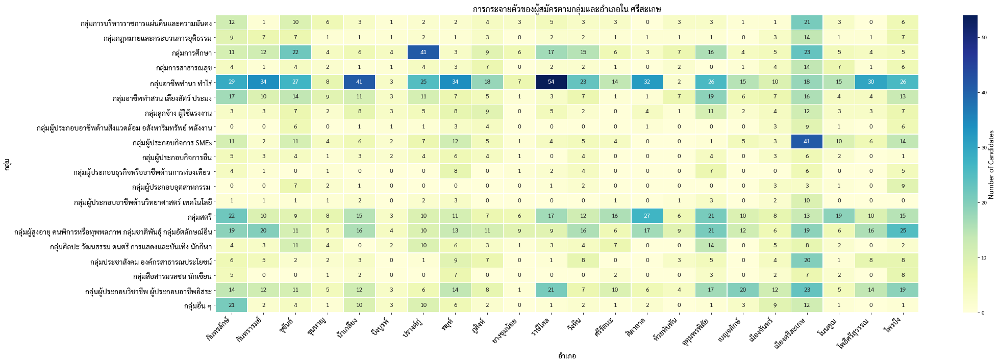

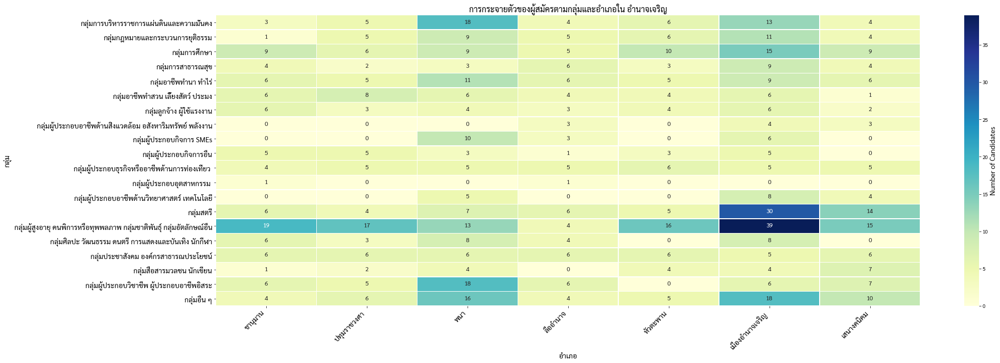

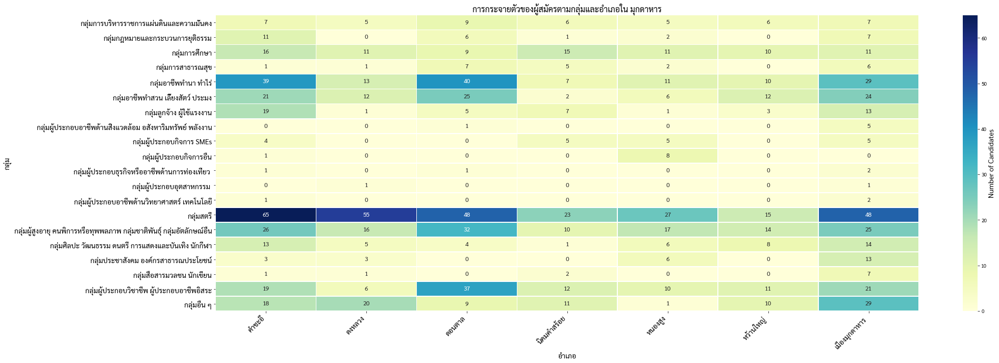

...

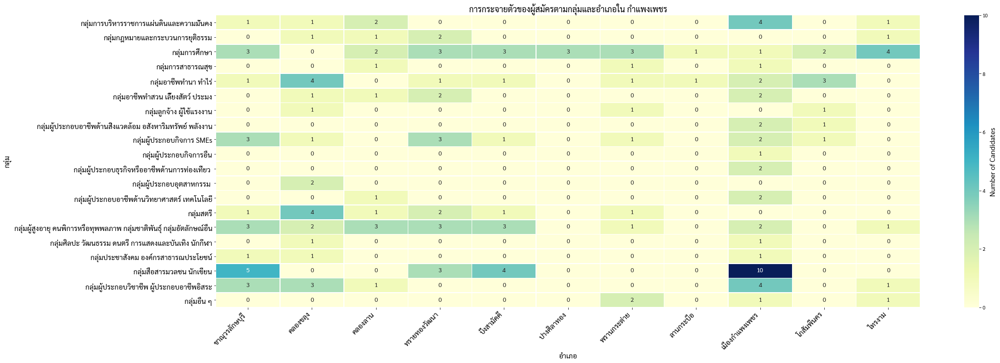

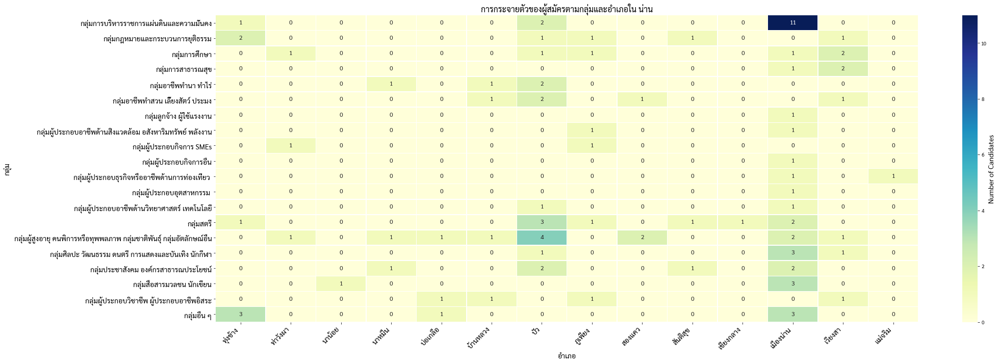

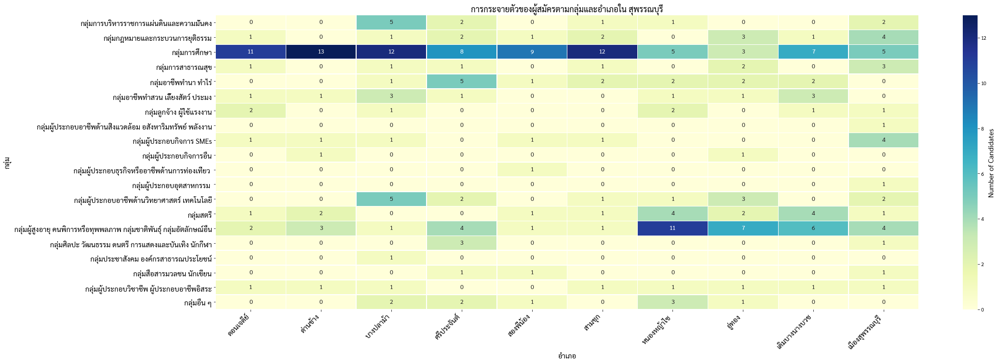

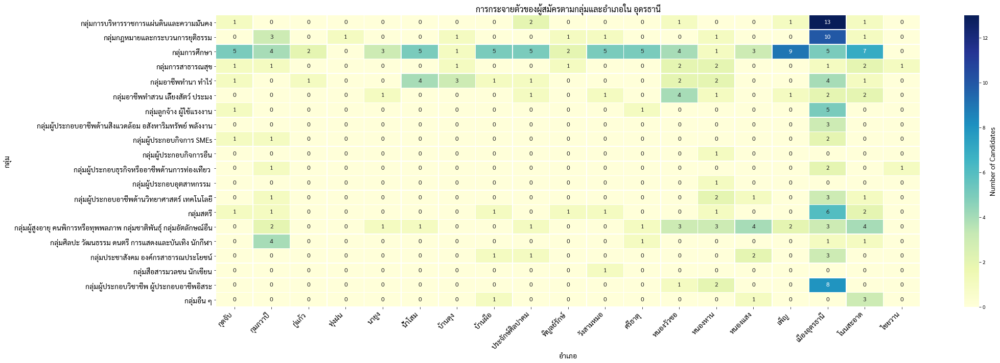

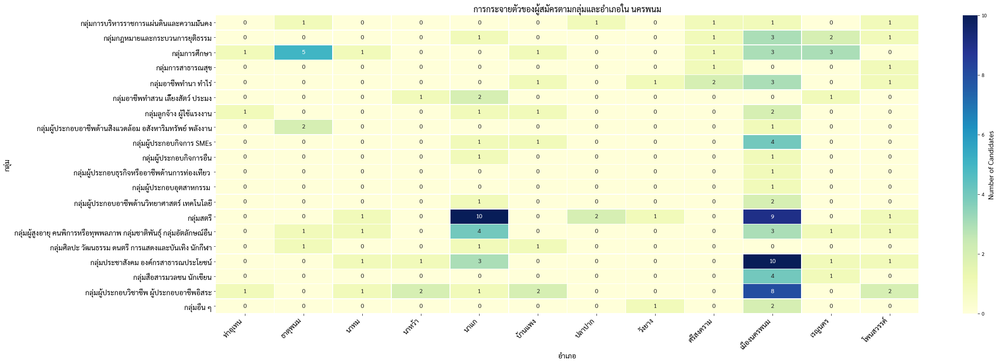

In [111]:
# Define the function to create and save a heatmap for a given province
def create_province_heatmap(df, province_name, output_dir="figures"):
    # Filter the data for the current province
    province_data = df[df['province_name'] == province_name]

    # Create a pivot table for the heatmap
    heatmap_data = province_data.pivot_table(index='job_name', columns='district_name', values='id', aggfunc='count', fill_value=0)

    # Get job_name-job_group mapping
    job_group_mapping = groups.set_index('job_name')
    heatmap_data = heatmap_data.join(job_group_mapping).sort_values('job_group').drop(columns='job_group')

    # Extract job_name-job_group mapping
    #job_group_mapping = province_data[['job_name', 'job_group']].drop_duplicates().set_index('job_name')
    #heatmap_data = heatmap_data.join(job_group_mapping).sort_values('job_group').drop(columns='job_group')

    # Create the heatmap with a better colormap scale
    plt.figure(figsize=(30, 10))
    heatmap = sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='d', linewidths=.5, annot_kws={"size": 12})

    # Add a color bar for interpretation
    cbar = heatmap.collections[0].colorbar
    cbar.set_label('Number of Candidates', fontsize=14)

    # Add titles and labels
    plt.title(f'การกระจายตัวของผู้สมัครตามกลุ่มและอำเภอใน {province_name}', fontsize=16)
    plt.xlabel('อำเภอ', fontsize=14)
    plt.ylabel('กลุ่ม', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=14)
    plt.yticks(rotation=0, fontsize=14)
  
    # Adjust layout and save the plot
    plt.tight_layout()
    plt.savefig(f"{output_dir}/heatmap_{province_name}.jpg", dpi=300)

    # Store province
    with open(f'heatmaps/{province_name}.txt', 'x') as f:
        f.write(str(heatmap_data.columns.to_list()
    ))
        
    # Create Array
    heatmap_data = heatmap_data.reset_index(drop=True)
    data_array = []
    for job_index, row in heatmap_data.iterrows():
        for province_index, count in enumerate(row[1:]):  # Skip the first column which is job_name
            data_array.append([province_index, job_index, count])
    with open(f'heatmaps/{province_name}_data.txt', 'x') as f:
        f.write(str(data_array))
    
# Iterate over each unique province to create individual heatmaps
for province in merged_df['province_name'].unique():
    create_province_heatmap(merged_df, province)